# Temperature  Forecast  Project using ML

## Data Description

Data Set Information:
    

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.


Attribute Information:
    

1. station - used weather station number: 1 to 25

    
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')

    
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6

    
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9

    
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5

    
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100

    
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5

    
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6

    
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9

    
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4

    
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97

    
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97

    
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98

    
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97

    
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7

    
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6

    
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8

    
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7

    
19. lat - Latitude (Â°): 37.456 to 37.645

    
20. lon - Longitude (Â°): 126.826 to 127.135

    
21. DEM - Elevation (m): 12.4 to 212.3

    
22. Slope - Slope (Â°): 0.1 to 5.2

    
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9

    
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9

    
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T
    

There are two target variables here: 


1) Next_Tmax: Next day maximum temperature
    

2) Next_Tmin: Next day  minimum temperature

## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')


## Loading the Dataset

In [2]:
df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv")
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [3]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [4]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [6]:
# Dimensiom of the dataset
df.shape

(7752, 25)

In [7]:
# Statistical description
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [8]:
# Checking the null values of the dataset
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

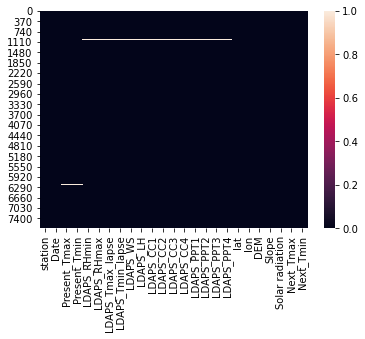

In [9]:
sns.heatmap(df.isnull())
plt.show()

## EDA

In [10]:
df['station'].value_counts()

25.0    310
12.0    310
2.0     310
3.0     310
4.0     310
5.0     310
6.0     310
7.0     310
8.0     310
9.0     310
10.0    310
11.0    310
13.0    310
23.0    310
14.0    310
15.0    310
16.0    310
18.0    310
20.0    310
22.0    310
24.0    310
17.0    310
19.0    310
21.0    310
1.0     310
Name: station, dtype: int64

In [11]:
df['Date'].value_counts()

04-07-2014    25
27-08-2017    25
17-08-2013    25
11-08-2015    25
25-08-2016    25
              ..
25-08-2013    25
25-07-2014    25
03-07-2015    25
31-07-2013    25
29-08-2013    25
Name: Date, Length: 310, dtype: int64

Now we are going to replace the NaN values

In [12]:
from sklearn.impute import SimpleImputer

In [13]:
imp=SimpleImputer(strategy='median')
var1=['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'Next_Tmax', 'Next_Tmin']
for i in var1:
    df[i]=imp.fit_transform(df[i].values.reshape(-1,1))

In [14]:
df=df.dropna()

In [15]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,30-08-2017,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,30-08-2017,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


In [16]:
import datetime as dt

In [17]:
#Extracting day
df['Day']=pd.to_datetime(df['Date']).dt.day

#Extracting month
df['month']=pd.to_datetime(df['Date']).dt.month

#Extracting month
df['Year']=pd.to_datetime(df['Date']).dt.year

# drop the column Date
df.drop('Date',axis=1,inplace=True)

In [18]:
df=df.reindex(columns=['station','Day','month','Year','Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','lat', 'lon',
       'DEM', 'Slope', 'Solar radiation','Next_Tmax', 'Next_Tmin'])

In [19]:
df

,station,Day,month,Year,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30,6,2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30,6,2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30,6,2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30,6,2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30,6,2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,30,8,2017,23.1,17.8,24.688997,78.261383,27.812697,18.303014,...,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,30,8,2017,22.5,17.4,30.094858,83.690018,26.704905,17.814038,...,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,30,8,2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,...,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,30,8,2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,...,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


## Data Visualization

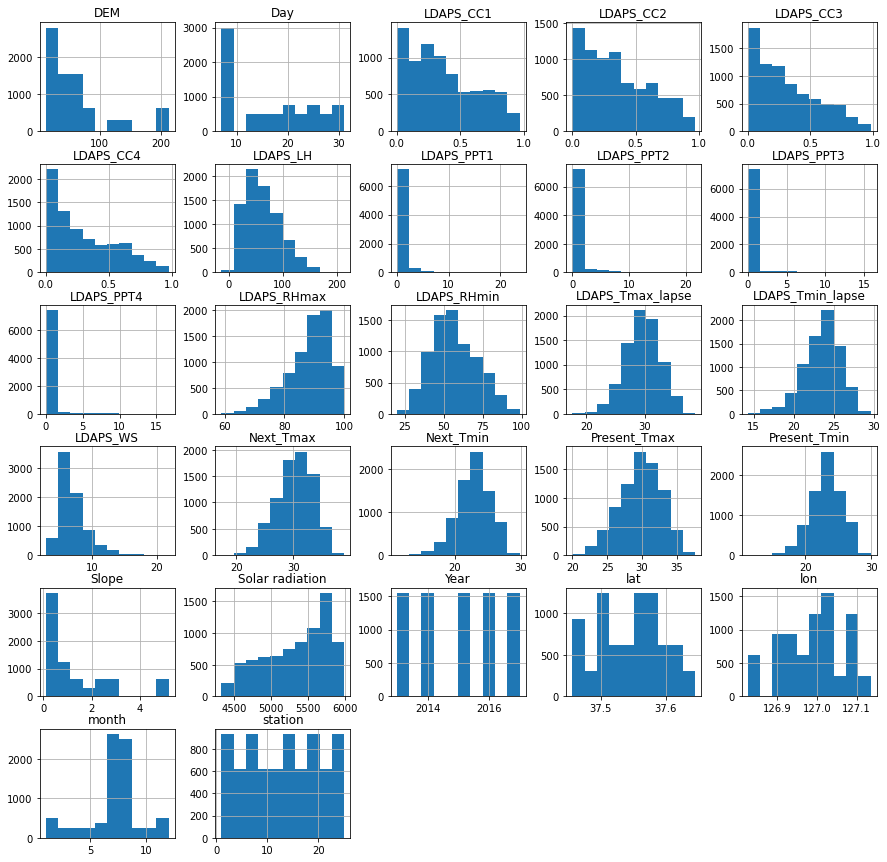

In [20]:
df.hist(figsize=(15,15))
plt.show()

### Bivariate Analysis

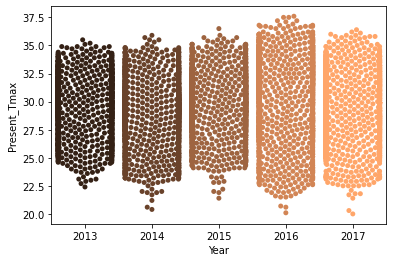

In [21]:
sns.swarmplot(df['Year'],df['Present_Tmax'],palette='copper')
plt.show()

* In the Year 2016 maximum temperature is high.

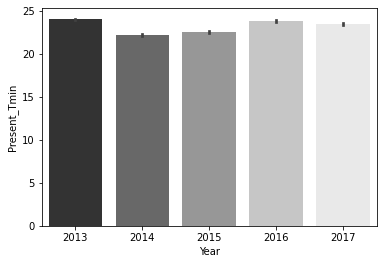

In [22]:
sns.barplot(x='Year',y='Present_Tmin',data=df,palette='Greys_r')
plt.show()

* Minimum temperature is high in the year 2013.

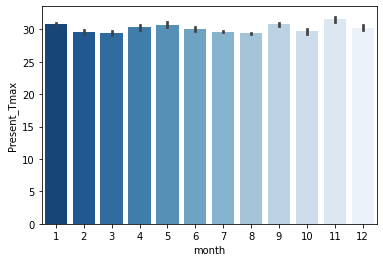

In [23]:
sns.barplot(x='month',y='Present_Tmax',data=df,palette='Blues_r')
plt.show()

* in the month november temperature is maximum.

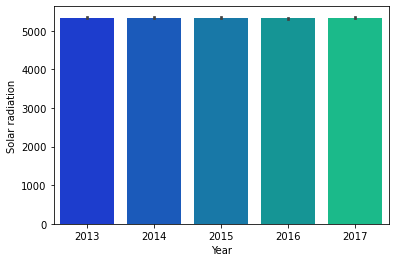

In [24]:
sns.barplot(x='Year',y='Solar radiation',data=df,palette='winter')
plt.show()

* we can see that solar radiation is almost same in years from 2013 to 2017

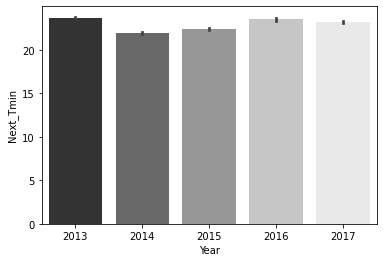

In [25]:
sns.barplot(x='Year',y='Next_Tmin',data=df,palette='Greys_r')
plt.show()

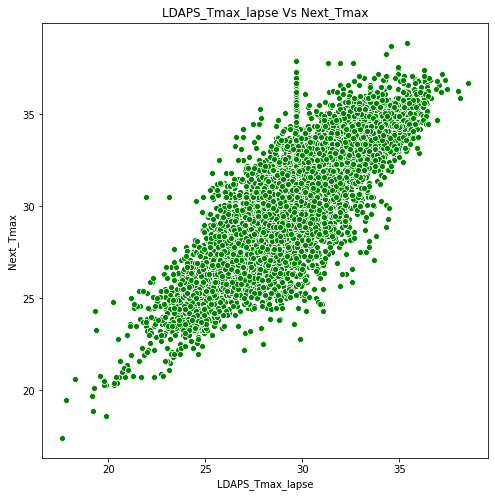

In [26]:
plt.figure(figsize=(8,8))
plt.title('LDAPS_Tmax_lapse Vs Next_Tmax')
ax=sns.scatterplot(x='LDAPS_Tmax_lapse',y='Next_Tmax',data=df,color='g')
plt.show()

* We can observe that there is positive relationship between LDAPS model forecast of next-day maximum air temperature applied lapse rate and Next day maximum temperature.

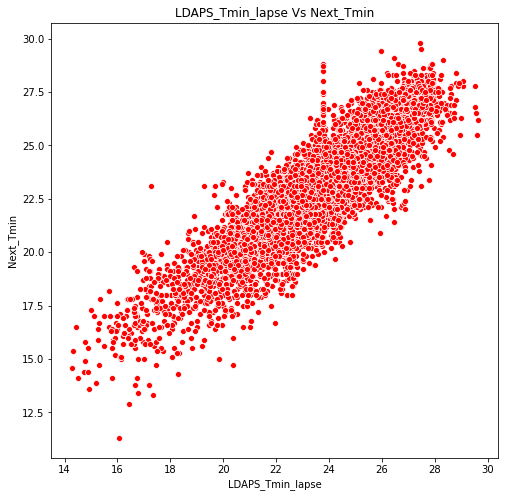

In [27]:
plt.figure(figsize=(8,8))
plt.title('LDAPS_Tmin_lapse Vs Next_Tmin')
ax=sns.scatterplot(x='LDAPS_Tmin_lapse',y='Next_Tmin',data=df,color='r')
plt.show()

* This plot aso shows the positive relationship between LDAPS next day minimum temperature lapse and Next day minimum temperature

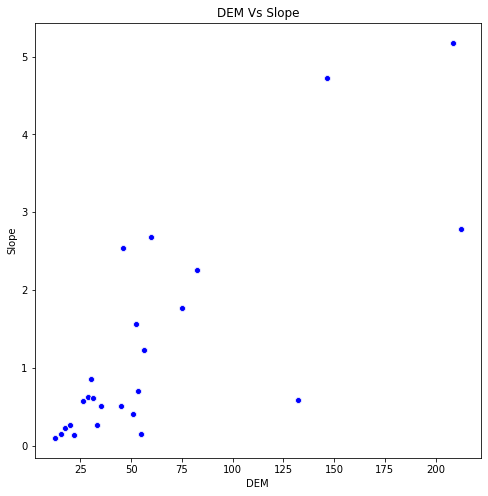

In [28]:
plt.figure(figsize=(8,8))
plt.title('DEM Vs Slope')
ax=sns.scatterplot(x='DEM',y='Slope',data=df,color='b')
plt.show()

* this plot also shows the positive relationship between elevation and slope.

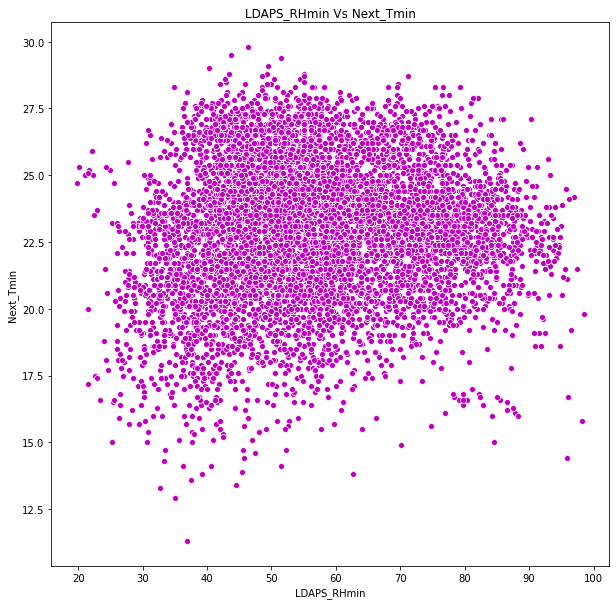

In [29]:
plt.figure(figsize=(10,10))
plt.title('LDAPS_RHmin Vs Next_Tmin')
ax=sns.scatterplot(x='LDAPS_RHmin',y='Next_Tmin',data=df,color='m')
plt.show()

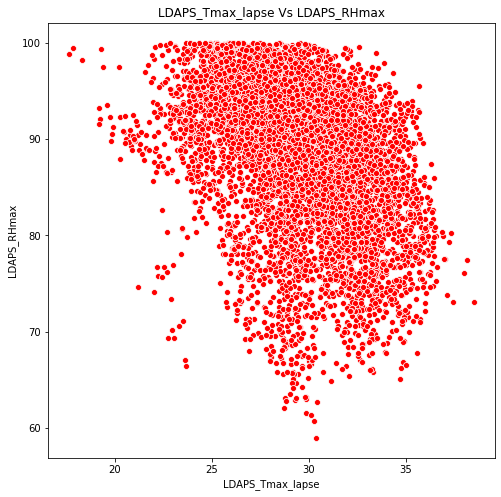

In [30]:
plt.figure(figsize=(8,8))
plt.title('LDAPS_Tmax_lapse Vs LDAPS_RHmax')
ax=sns.scatterplot(x='LDAPS_Tmax_lapse',y='LDAPS_RHmax',data=df,color='r')
plt.show()

* We can see the negative relationship between next day maximum relative humidity ang next day maximum air temperature.

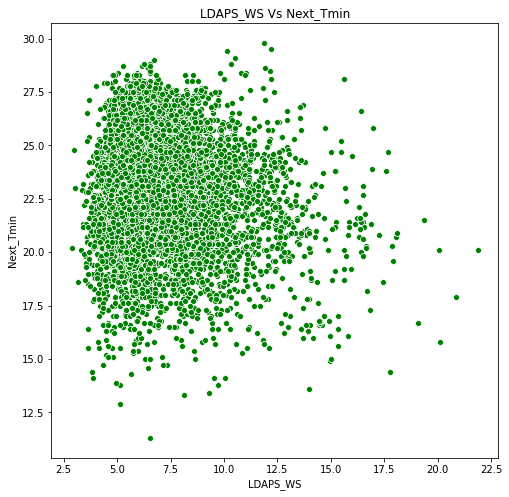

In [31]:
plt.figure(figsize=(8,8))
plt.title('LDAPS_WS Vs Next_Tmin')
ax=sns.scatterplot(x='LDAPS_WS',y='Next_Tmin',data=df,color='g')
plt.show()

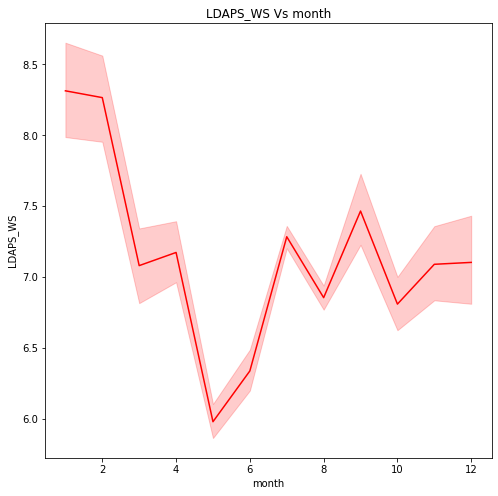

In [32]:
plt.figure(figsize=(8,8))
plt.title('LDAPS_WS Vs month')
ax=sns.lineplot(x='month',y='LDAPS_WS',data=df,color='r')
plt.show()

* wind speed is maximum in the first 2 months.

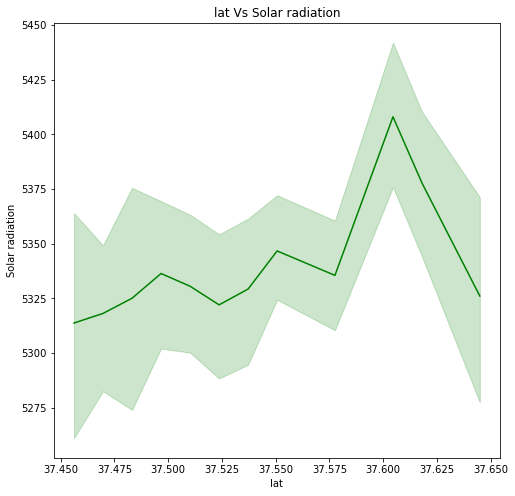

In [33]:
plt.figure(figsize=(8,8))
plt.title('lat Vs Solar radiation')
ax=sns.lineplot(x='lat',y='Solar radiation',data=df,color='g')
plt.show()

* As latitude increases solar radiation increases.

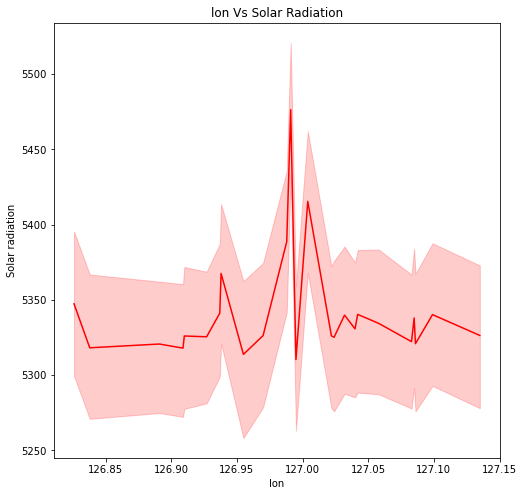

In [34]:
plt.figure(figsize=(8,8))
plt.title('lon Vs Solar Radiation')
ax=sns.lineplot(x='lon',y='Solar radiation',data=df,color='r')
plt.show()

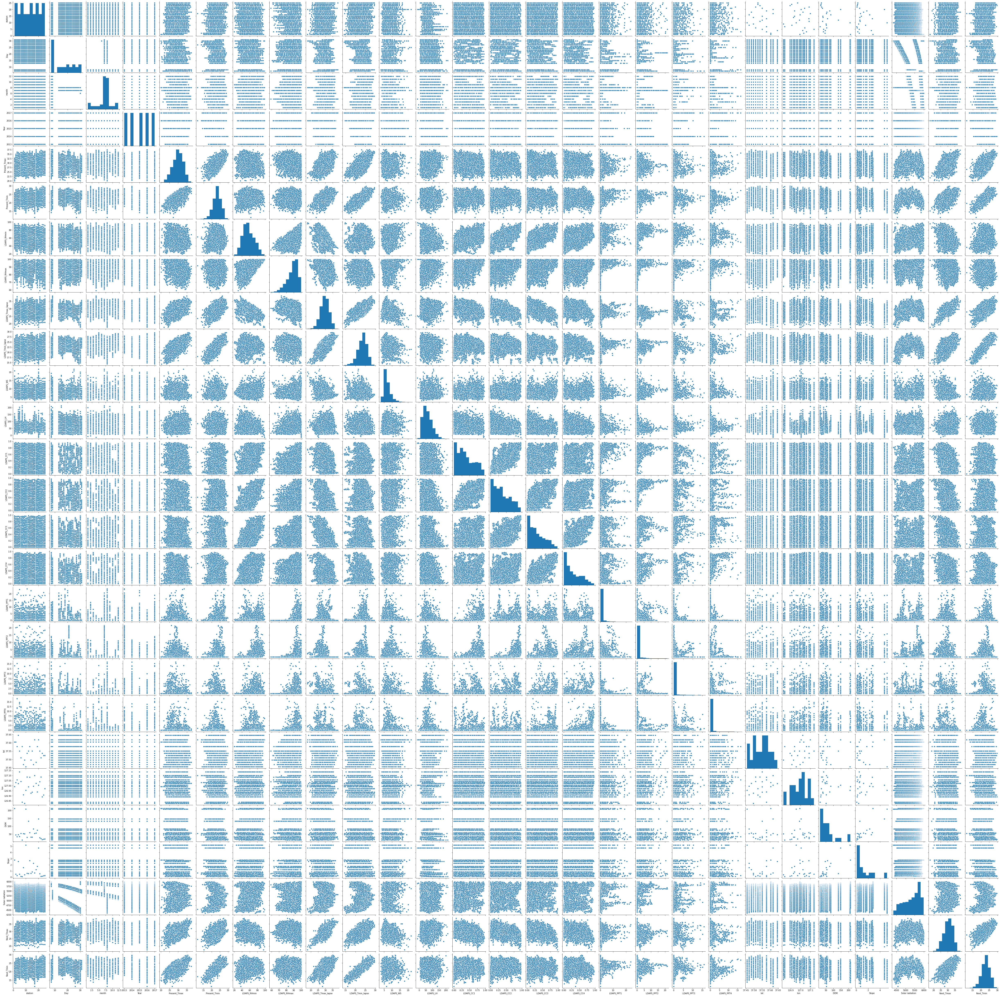

In [35]:
# Multivariate Analysis
sns.pairplot(df)

## checking Correlation

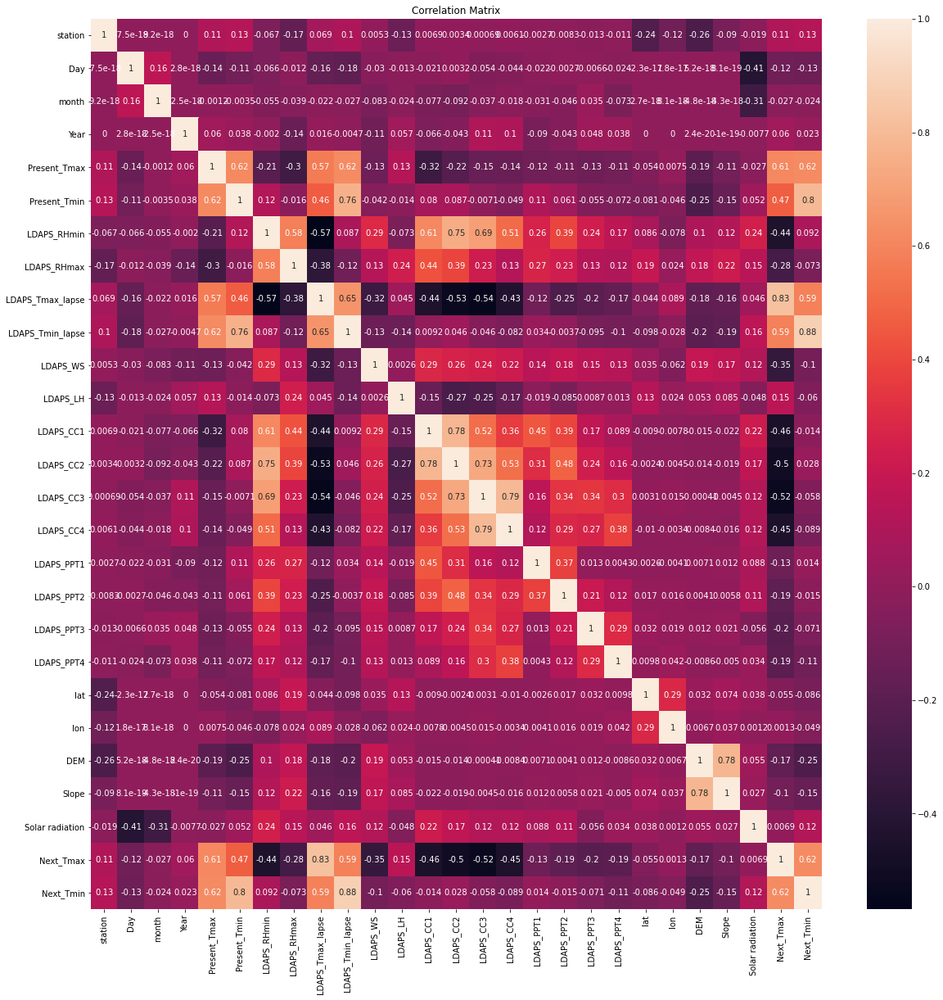

In [36]:
corr_mat=df.corr()

plt.figure(figsize=(20,20))
sns.heatmap(corr_mat,annot=True)
plt.title('Correlation Matrix')
plt.show()

* Next_Tmax has strong correlation with Present_Tmax,Present_Tmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse and Next_Tmin.


* Next_Tmin has strong correlation with Present_Tmin,Present_Tmax,LDAPS_Tmin_lapse,LDAPS_Tmax_lapse and Next_Tmax.


* Slope is highly correlated with DEM.


* LDAPS_RHmin and LDAPS_RHmax are strongly correlated with the variables LDAPS_CC1,LDAPS_CC2,LDAPS_CC3 and LDAPS_CC4.


## Checking Outliers

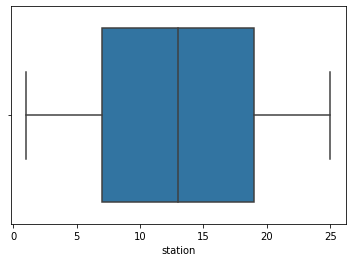

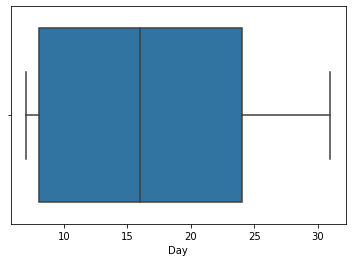

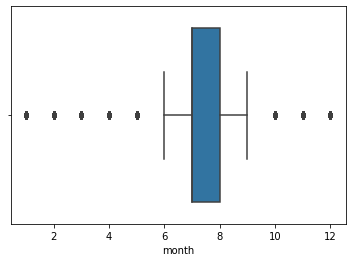

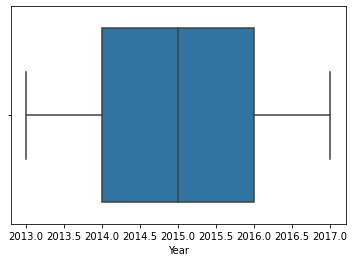

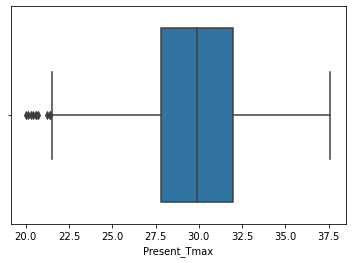

...

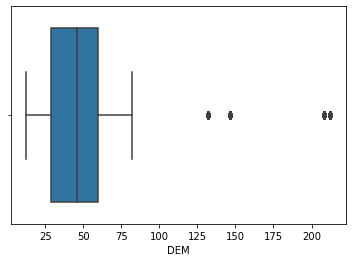

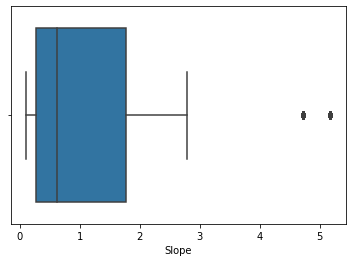

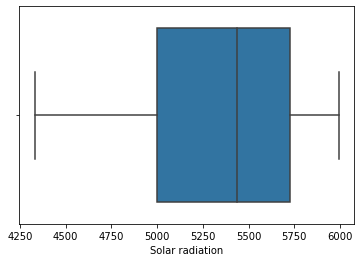

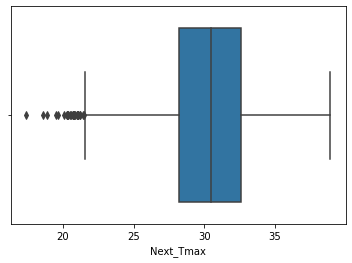

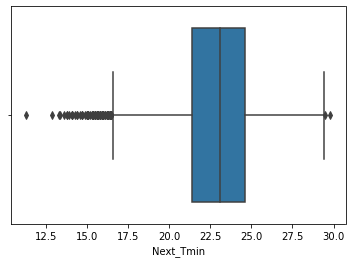

In [37]:
for i in ['station','Day','month','Year','Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','lat', 'lon',
       'DEM', 'Slope', 'Solar radiation','Next_Tmax', 'Next_Tmin']:
    sns.boxplot(df[i])
    plt.show()

* There are no considerable outliers in the dataset.

In [38]:
#Seperating independent variables and Target variables in x and y
x=df.iloc[:,0:-2]
y=df.iloc[:,-2:]

## Distribution of data along all columns

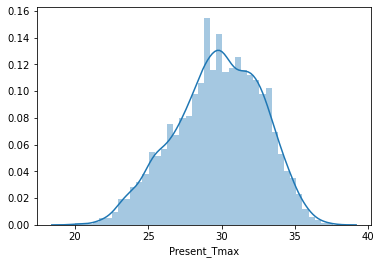

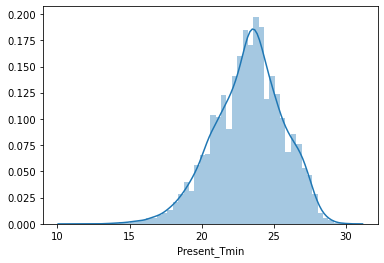

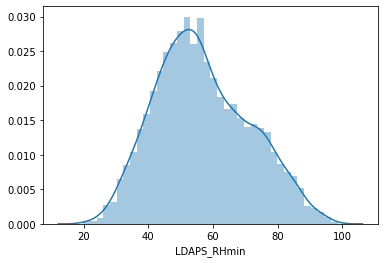

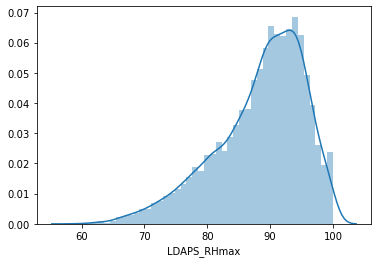

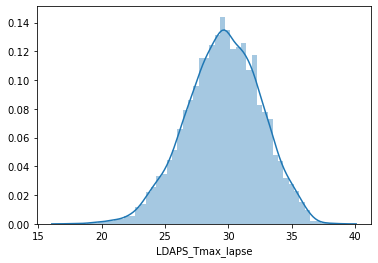

...

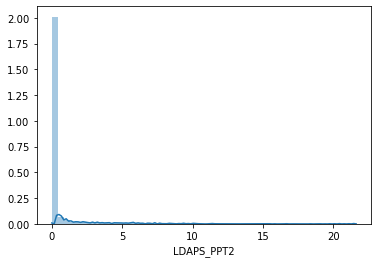

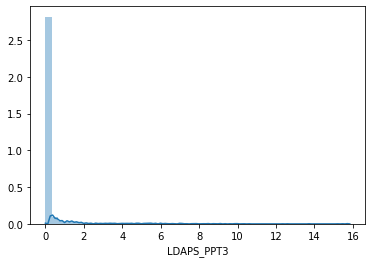

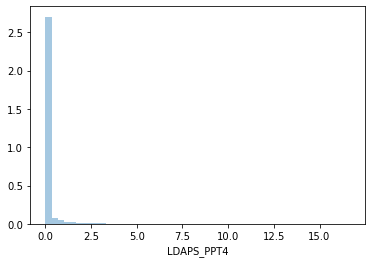

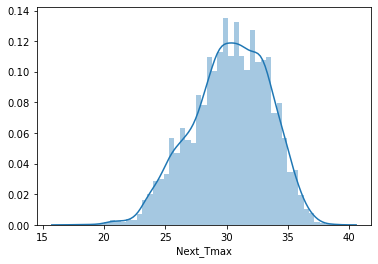

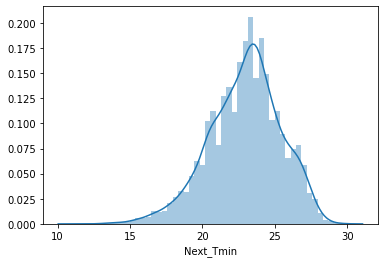

In [39]:
for i in var1:
    sns.distplot(df[i])
    plt.show()

## Checking Skewness

In [40]:
x.skew()

station             0.000000
Day                 0.245482
month              -0.705241
Year                0.000000
Present_Tmax       -0.264215
Present_Tmin       -0.359513
LDAPS_RHmin         0.303578
LDAPS_RHmax        -0.855863
LDAPS_Tmax_lapse   -0.225096
LDAPS_Tmin_lapse   -0.582013
LDAPS_WS            1.562204
LDAPS_LH            0.672151
LDAPS_CC1           0.464742
LDAPS_CC2           0.476659
LDAPS_CC3           0.646029
LDAPS_CC4           0.673054
LDAPS_PPT1          5.325873
LDAPS_PPT2          5.714821
LDAPS_PPT3          6.370279
LDAPS_PPT4          6.744793
lat                 0.086942
lon                -0.285300
DEM                 1.723944
Slope               1.563346
Solar radiation    -0.511006
dtype: float64

## Removing skewness

In [41]:
from sklearn.preprocessing import power_transform
df_new=power_transform(x)
df_new=pd.DataFrame(df_new,columns=x.columns)

In [42]:
df_new.skew()

station            -0.204604
Day                -0.041810
month               0.043694
Year               -0.000215
Present_Tmax       -0.035635
Present_Tmin       -0.013928
LDAPS_RHmin        -0.017327
LDAPS_RHmax        -0.116480
LDAPS_Tmax_lapse   -0.010548
LDAPS_Tmin_lapse   -0.019053
LDAPS_WS            0.004202
LDAPS_LH            0.031208
LDAPS_CC1           0.048097
LDAPS_CC2           0.046374
LDAPS_CC3           0.089606
LDAPS_CC4           0.129753
LDAPS_PPT1          1.463967
LDAPS_PPT2          1.646387
LDAPS_PPT3          1.824595
LDAPS_PPT4          2.059402
lat                 0.070111
lon                -0.198533
DEM                 0.039436
Slope               0.233914
Solar radiation    -0.176686
dtype: float64

In [43]:
x=df_new

In [44]:
x

,station,Day,month,Year,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.860217,1.418744,-0.582337,-1.414316,-0.409911,-0.799426,0.174949,0.269931,-0.557633,-0.314397,...,-0.580480,-0.557329,-0.519106,-0.492319,-0.444374,1.188579,-0.027662,1.835459,1.314447,1.850167
1,-1.648224,1.418744,-0.582337,-1.414316,0.705327,-0.721704,-0.239869,0.182702,0.043643,0.142943,...,-0.599355,-0.557329,-0.519106,-0.492319,-0.444374,1.188579,0.497443,0.056032,-0.385353,1.401217
2,-1.454677,1.418744,-0.582337,-1.414316,0.595752,-0.028129,-0.499986,-0.777025,0.127215,0.393555,...,-0.515519,-0.557329,-0.519106,-0.492319,-0.444374,0.656862,0.836831,-0.364677,-0.949335,1.381155
3,-1.273784,1.418744,-0.582337,-1.414316,0.742083,0.014515,0.173880,1.316625,-0.006842,-0.176306,...,-0.561044,-0.557329,-0.519106,-0.492319,-0.444374,1.979398,0.368238,0.084942,1.235549,1.358278
4,-1.102374,1.418744,-0.582337,-1.414316,0.523280,-0.603596,0.033682,0.107726,-0.209095,-0.105642,...,-0.360578,-0.557329,-0.519106,-0.492319,-0.444374,0.124557,1.871848,-0.290515,-0.401751,1.367247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,1.078456,1.418744,0.363958,1.414111,-2.078126,-2.060957,-2.619794,-1.386097,-0.643741,-1.968868,...,-1.446957,-0.557329,-0.519106,-0.492319,-0.444374,0.124557,0.601337,-0.721794,-0.279523,-1.739436
7746,1.196045,1.418744,0.363958,1.414111,-2.235555,-2.185240,-2.066717,-0.811603,-1.001874,-2.103051,...,-1.342800,-0.557329,-0.519106,-0.492319,-0.444374,-0.682713,1.207974,-1.006373,-1.355104,-1.756893
7747,1.312275,1.418744,0.363958,1.414111,-2.024736,-2.276394,-2.402655,-1.329445,-1.113623,-1.832817,...,-1.482044,-0.557329,-0.519106,-0.492319,-0.444374,-0.143946,-1.258231,-1.578769,-1.280717,-1.755049
7748,1.427218,1.418744,0.363958,1.414111,-2.024736,-2.092322,-2.690436,-1.472390,-0.904277,-1.845209,...,-1.482044,-0.557329,-0.519106,-0.492319,-0.444374,-0.413036,-1.041861,-1.401188,-1.073155,-1.761072


## Scaling using StandardScaler

In [45]:
from sklearn.preprocessing import StandardScaler

In [46]:
ss=StandardScaler()
x=ss.fit_transform(x)

## Finding the Best Random State

In [47]:
maxAccu=0
maxRS=0
for i in range(1,1000):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=i)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    predrf=LR.predict(x_test)
    rsc=r2_score(y_test,predrf)
    if rsc>maxAccu:
        maxAccu=rsc
        maxRS=i
print("Best accuracy is",maxAccu,"on Random_state",maxRS)       

Best accuracy is 0.8214666080129158 on Random_state 36


## Train-Test split

In [48]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=36)

In [49]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((6200, 25), (1550, 25), (6200, 2), (1550, 2))

In [50]:
model=[LinearRegression(),DecisionTreeRegressor(),KNeighborsRegressor(),RandomForestRegressor(),]

for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print('For',m,':')
    print('Accuracy score:',r2_score(y_test,predm))
    print('mse:',mean_squared_error(y_test,predm))
    print('mae:',mean_absolute_error(y_test,predm))
    print('\n')

For LinearRegression() :
Accuracy score: 0.8214666080129158
mse: 1.5316886019300289
mae: 0.9321936038292524


For DecisionTreeRegressor() :
Accuracy score: 0.7866694001009154
mse: 1.7508548387096758
mae: 0.9514516129032249


For KNeighborsRegressor() :
Accuracy score: 0.8824193986904406
mse: 0.9693465806451637
mae: 0.7373677419354832


For RandomForestRegressor() :
Accuracy score: 0.9131713920089333
mse: 0.7193556416129028
mae: 0.6381919354838714




## Cross Validation

In [51]:
for m in model:
    score=cross_val_score(m,x,y,cv=5)
    print('For',m,':')
    print('Score:',score)
    print('Cross Validation Score:',score.mean())
    print('Standard Deviation:',score.std())
    print('\n')

For LinearRegression() :
Score: [0.67783987 0.63703318 0.73702626 0.82823421 0.69690664]
Cross Validation Score: 0.7154080315835657
Standard Deviation: 0.06495133354917555


For DecisionTreeRegressor() :
Score: [0.25526982 0.32757478 0.43473998 0.70782486 0.47539927]
Cross Validation Score: 0.4401617409037216
Standard Deviation: 0.15477433310455505


For KNeighborsRegressor() :
Score: [0.44622094 0.33090243 0.52149463 0.68278182 0.64165104]
Cross Validation Score: 0.5246101703268835
Standard Deviation: 0.12836985812348817


For RandomForestRegressor() :
Score: [0.63515323 0.63003818 0.70447515 0.82938127 0.74180602]
Cross Validation Score: 0.7081707689436886
Standard Deviation: 0.07385558196167134




#### Our best model is LinearRegression(),since the difference between the r2 score and cross validation score is minimum for this model.

## Regularization

In [52]:
from sklearn.model_selection import GridSearchCV

In [53]:
from sklearn.linear_model import Lasso
parameters={'alpha':[.0001,.001,.01,.1,1,10],'random_state':range(0,10)}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(x_train,y_train)

print(clf.best_params_) 

{'alpha': 0.001, 'random_state': 0}


In [54]:
ls=Lasso(alpha=.0001,random_state=0)
ls.fit(x_train,y_train)
ls.score(x_train,y_train)
pred_ls=ls.predict(x_test)

lss=r2_score(y_test,pred_ls)

In [55]:
cv_score=cross_val_score(ls,x,y,cv=5)
cv_mean=cv_score.mean()
print('cross validation score',cv_mean)

cross validation score 0.7154722386294111


## Hyper Parameter Tuning

In [56]:
# Creating parameter list to pass in GridSearchCV
parameters={'fit_intercept':['True','False'],'normalize':['True','False'],'copy_X':['True','False'],'n_jobs':[1,10]}

In [57]:
GCV=GridSearchCV(LinearRegression(),parameters,cv=5)

In [58]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'copy_X': ['True', 'False'],
                         'fit_intercept': ['True', 'False'], 'n_jobs': [1, 10],
                         'normalize': ['True', 'False']})

In [59]:
GCV.best_params_

{'copy_X': 'True', 'fit_intercept': 'True', 'n_jobs': 1, 'normalize': 'True'}

In [60]:
GCV_pred=GCV.best_estimator_.predict(x_test)

In [61]:
r2_score(y_test,GCV_pred)

0.8214666080129158

## Saving the Best model

In [62]:
import pickle
filename='Temperature_forecasting.pkl'
pickle.dump(GCV.best_estimator_,open('Temperature_forecasting.pkl','wb'))

## Conclusion

In [63]:
loaded_model=pickle.load(open('Temperature_forecasting.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result)

0.8214666080129158


In [64]:
a=np.array(y_test)
predicted=np.array(GCV.predict(x_test))

In [65]:
predicted

array([[29.2372628 , 24.07861015],
       [24.87626429, 18.36349246],
       [32.74804835, 24.10500198],
       ...,
       [30.57241407, 20.84729668],
       [33.33899866, 23.94871205],
       [33.4826937 , 25.70280289]])